## Predict Gold Price

### Objective:
- This project's main objective is to generate a machine learning model to predict the price of gold based on various features provided by the kaggle website.

- Este projeto tem como objetivo principal gerar um modelo de machine learning para predizer o preço do ouro baseado em várias características fornecidas pelo site do kaggle.

### Data Origin:
- Dataset: https://www.kaggle.com/datasets/franciscogcc/financial-data/data
The data is a time series dataset with financial info for some market indices, commodities, economic indicators and forex rates. Market indices and commodities are represented via the respective exchange traded fund. It includes values from 2010 to 2024.

- Os dados são um conjunto de dados de séries temporais com informações financeiras para alguns índices de mercado, commodities, indicadores econômicos e taxas de câmbio. Os índices de mercado e commodities são representados por meio do respectivo fundo negociado em bolsa. Inclui valores de 2010 a 2024.

- ## Análise exploratória dos dados
- ## Preparação dos dados
- ## Armazenamento dos dados tratados

In [110]:
# maximiza nro de linhas e colunas para exibição
# inibe mensagens de warning
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
import warnings
warnings.simplefilter('ignore')

In [111]:
from fc import fc_retira_outliers as rto
from scipy.stats import skew 
from scipy.stats import kurtosis 

from sklearn.preprocessing import (
    StandardScaler, # faz a padronização dos dados para melhorar a normalidade
)

from sklearn.compose import ColumnTransformer
import statsmodels.api as sm

In [112]:
# preparação e visualização de dados

import numpy as np
#import pandas as pd
#import pandas_datareader.data as web

from matplotlib import pyplot
#from pandas.plotting import scatter_matrix
import seaborn as sns

from sklearn.preprocessing import StandardScaler
#from pandas.plotting import scatter_matrix
#from statsmodels.graphics.tsaplots import plot_acf

In [113]:
# carregando arquivo de dados da qualidade do ar
df_gold = pd.read_csv('dataset/financial_regression.csv', sep=',')

In [114]:
# verificando o tamanho do arquivo conferindo a quantidade de linhas(registros) e colunas(varáveis)
df_gold.shape

(3904, 47)

In [115]:
# reconhecendo as variáveis disponíveis
df_gold.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3904 entries, 0 to 3903
Data columns (total 47 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   date                3904 non-null   object 
 1   sp500 open          3719 non-null   float64
 2   sp500 high          3719 non-null   float64
 3   sp500 low           3719 non-null   float64
 4   sp500 close         3719 non-null   float64
 5   sp500 volume        3719 non-null   float64
 6   sp500 high-low      3719 non-null   float64
 7   nasdaq open         3719 non-null   float64
 8   nasdaq high         3719 non-null   float64
 9   nasdaq low          3719 non-null   float64
 10  nasdaq close        3719 non-null   float64
 11  nasdaq volume       3719 non-null   float64
 12  nasdaq high-low     3719 non-null   float64
 13  us_rates_%          176 non-null    float64
 14  CPI                 176 non-null    float64
 15  usd_chf             3694 non-null   float64
 16  eur_us

Verificamos que até a coluna 14 não existe nenhuma linha com nulos e que existem alguns campos que precisam ser removidos, por exemplo os 2 últimos serão eliminados do dataframe por possuirem somente valores nulos, vamos analisar mais a fundo cada um deles verificando a necessidade de modificar o tipo de dados.

In [116]:
# reconhecendo os dados do dataframe
df_gold.head(5)

,date,sp500 open,sp500 high,sp500 low,sp500 close,sp500 volume,sp500 high-low,nasdaq open,nasdaq high,nasdaq low,nasdaq close,nasdaq volume,nasdaq high-low,us_rates_%,CPI,usd_chf,eur_usd,GDP,silver open,silver high,silver low,silver close,silver volume,silver high-low,oil open,oil high,oil low,oil close,oil volume,oil high-low,platinum open,platinum high,platinum low,platinum close,platinum volume,platinum high-low,palladium open,palladium high,palladium low,palladium close,palladium volume,palladium high-low,gold open,gold high,gold low,gold close,gold volume
0,2010-01-14,114.49,115.14,114.42,114.93,115646960.0,0.72,46.26,46.520,46.22,46.39,75209000.0,0.300,NaN,NaN,1.0206,1.4478,NaN,18.58,18.70,18.45,18.66,69804.0,0.25,39.30,39.4400,38.88,39.06,8575821.0,0.5600,160.13,161.85,159.7200,161.45,228500.0,2.1300,43.93,45.02,43.86,44.84,364528.0,1.16,111.51,112.37,110.79,112.03,18305238.0
1,2010-01-15,114.73,114.84,113.20,113.64,212252769.0,1.64,46.46,46.550,45.65,45.85,126849300.0,0.900,NaN,NaN,1.0264,1.4376,NaN,18.54,18.54,18.36,18.41,205106.0,0.18,38.97,39.0200,38.28,38.40,12615299.0,0.7400,160.68,161.25,159.5000,160.25,189900.0,1.7500,45.18,45.76,44.40,45.76,442210.0,1.36,111.35,112.01,110.38,110.86,18000724.0
2,2010-01-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2010-01-19,113.62,115.13,113.59,115.06,138671890.0,1.54,45.96,46.640,45.95,46.59,84388200.0,0.690,NaN,NaN,1.0340,1.4269,NaN,18.53,18.79,18.50,18.79,130552.0,0.29,38.07,38.9499,38.03,38.93,8180157.0,0.9199,162.23,165.20,162.1722,165.12,295900.0,3.0278,46.01,47.08,45.70,46.94,629150.0,1.38,110.95,111.75,110.83,111.52,10467927.0
4,2010-01-20,114.28,114.45,112.98,113.89,216330645.0,1.47,46.27,46.604,45.43,45.92,145680000.0,1.174,NaN,NaN,1.0453,1.4094,NaN,18.31,18.31,17.78,17.86,230907.0,0.53,38.23,38.3500,37.88,37.89,11438685.0,0.4700,163.51,163.51,159.0900,163.22,438200.0,4.4200,46.59,47.31,45.17,47.05,643198.0,2.14,109.97,110.05,108.46,108.94,17534231.0


As duas últimas colunas, como já mencionado, possuem valores nulos e serão eliminadas do dataframe, as demais colunas apresentam dados de data, hora e valores numéricos.

In [117]:
# verificando e confirmando se existe algum campo nulo no dataframe
df_gold.isnull().sum()

date                     0
sp500 open             185
sp500 high             185
sp500 low              185
sp500 close            185
sp500 volume           185
sp500 high-low         185
nasdaq open            185
nasdaq high            185
nasdaq low             185
nasdaq close           185
nasdaq volume          185
nasdaq high-low        185
us_rates_%            3728
CPI                   3728
usd_chf                210
eur_usd                210
GDP                   3847
silver open            185
silver high            185
silver low             185
silver close           185
silver volume          185
silver high-low        185
oil open               185
oil high               185
oil low                185
oil close              185
oil volume             185
oil high-low           185
platinum open          185
platinum high          185
platinum low           185
platinum close         185
platinum volume        185
platinum high-low      185
palladium open         185
p

Mesmo que não tenha aparecido nenhum nulo utilizando a função .info() faz-se necessário confirmar se realmente não tem nulos e fizemos isso com a função .isnull().sum() somando as ocorrências de valores nulos que existem no dataframe.

In [118]:
# apagando as colunas que possuem excesso de nulos
df_gold = df_gold.drop('us_rates_%', axis=1)
df_gold = df_gold.drop('CPI', axis=1)
df_gold = df_gold.drop('GDP', axis=1)

In [119]:
# apagando todas as linhas que possuem valores nulos
df_gold = df_gold.dropna()

Nesse caso apagamos as linhas, com nulos, pois todas as colunas apresentaram campos nulos em algum momento.

In [120]:
# verificando a duplicidade de alguma linha
df_gold.duplicated().sum()

0

In [121]:
# vamos modificar o tipo de dados de alguns campos conforme o conteúdo de informação contido nos mesmos
df_gold['date'] = df_gold['date'].astype('datetime64[ns]')

A existência de duplicidade pode comprometer os resultados quando treinarmos os modelos de machine learning, além de consumir recursos computacionais desnecessariamente, dessa excluiremos as linhas duplicadas, deixando somente uma ocorrência de cada linha. Nesse caso a soma de linhas duplicadas foi zero.

In [122]:
# verificando e confirmando se existe algum campo nulo no dataframe
df_gold.isnull().sum()

date                  0
sp500 open            0
sp500 high            0
sp500 low             0
sp500 close           0
sp500 volume          0
sp500 high-low        0
nasdaq open           0
nasdaq high           0
nasdaq low            0
nasdaq close          0
nasdaq volume         0
nasdaq high-low       0
usd_chf               0
eur_usd               0
silver open           0
silver high           0
silver low            0
silver close          0
silver volume         0
silver high-low       0
oil open              0
oil high              0
oil low               0
oil close             0
oil volume            0
oil high-low          0
platinum open         0
platinum high         0
platinum low          0
platinum close        0
platinum volume       0
platinum high-low     0
palladium open        0
palladium high        0
palladium low         0
palladium close       0
palladium volume      0
palladium high-low    0
gold open             0
gold high             0
gold low        

In [123]:
# verificando quantos registros sobraram
df_gold.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3677 entries, 0 to 3900
Data columns (total 44 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   date                3677 non-null   datetime64[ns]
 1   sp500 open          3677 non-null   float64       
 2   sp500 high          3677 non-null   float64       
 3   sp500 low           3677 non-null   float64       
 4   sp500 close         3677 non-null   float64       
 5   sp500 volume        3677 non-null   float64       
 6   sp500 high-low      3677 non-null   float64       
 7   nasdaq open         3677 non-null   float64       
 8   nasdaq high         3677 non-null   float64       
 9   nasdaq low          3677 non-null   float64       
 10  nasdaq close        3677 non-null   float64       
 11  nasdaq volume       3677 non-null   float64       
 12  nasdaq high-low     3677 non-null   float64       
 13  usd_chf             3677 non-null   float64       
 1

In [124]:
# reconhecendo os dados do dataframe
df_gold.head(5)

,date,sp500 open,sp500 high,sp500 low,sp500 close,sp500 volume,sp500 high-low,nasdaq open,nasdaq high,nasdaq low,nasdaq close,nasdaq volume,nasdaq high-low,usd_chf,eur_usd,silver open,silver high,silver low,silver close,silver volume,silver high-low,oil open,oil high,oil low,oil close,oil volume,oil high-low,platinum open,platinum high,platinum low,platinum close,platinum volume,platinum high-low,palladium open,palladium high,palladium low,palladium close,palladium volume,palladium high-low,gold open,gold high,gold low,gold close,gold volume
0,2010-01-14,114.49,115.14,114.42,114.93,115646960.0,0.72,46.26,46.520,46.22,46.39,75209000.0,0.300,1.0206,1.4478,18.58,18.70,18.45,18.66,69804.0,0.25,39.30,39.4400,38.88,39.06,8575821.0,0.5600,160.13,161.85,159.7200,161.45,228500.0,2.1300,43.93,45.02,43.86,44.84,364528.0,1.16,111.51,112.37,110.79,112.03,18305238.0
1,2010-01-15,114.73,114.84,113.20,113.64,212252769.0,1.64,46.46,46.550,45.65,45.85,126849300.0,0.900,1.0264,1.4376,18.54,18.54,18.36,18.41,205106.0,0.18,38.97,39.0200,38.28,38.40,12615299.0,0.7400,160.68,161.25,159.5000,160.25,189900.0,1.7500,45.18,45.76,44.40,45.76,442210.0,1.36,111.35,112.01,110.38,110.86,18000724.0
3,2010-01-19,113.62,115.13,113.59,115.06,138671890.0,1.54,45.96,46.640,45.95,46.59,84388200.0,0.690,1.0340,1.4269,18.53,18.79,18.50,18.79,130552.0,0.29,38.07,38.9499,38.03,38.93,8180157.0,0.9199,162.23,165.20,162.1722,165.12,295900.0,3.0278,46.01,47.08,45.70,46.94,629150.0,1.38,110.95,111.75,110.83,111.52,10467927.0
4,2010-01-20,114.28,114.45,112.98,113.89,216330645.0,1.47,46.27,46.604,45.43,45.92,145680000.0,1.174,1.0453,1.4094,18.31,18.31,17.78,17.86,230907.0,0.53,38.23,38.3500,37.88,37.89,11438685.0,0.4700,163.51,163.51,159.0900,163.22,438200.0,4.4200,46.59,47.31,45.17,47.05,643198.0,2.14,109.97,110.05,108.46,108.94,17534231.0
5,2010-01-21,113.92,114.27,111.56,111.70,344747028.0,2.71,46.06,46.350,45.30,45.49,204939600.0,1.050,1.0426,1.4106,17.82,17.91,17.32,17.38,198067.0,0.59,38.22,38.4100,37.09,37.24,13716561.0,1.3200,161.86,162.50,159.1200,159.79,247600.0,3.3800,46.60,46.98,45.07,45.30,388457.0,1.91,108.48,108.78,106.61,107.37,25747831.0


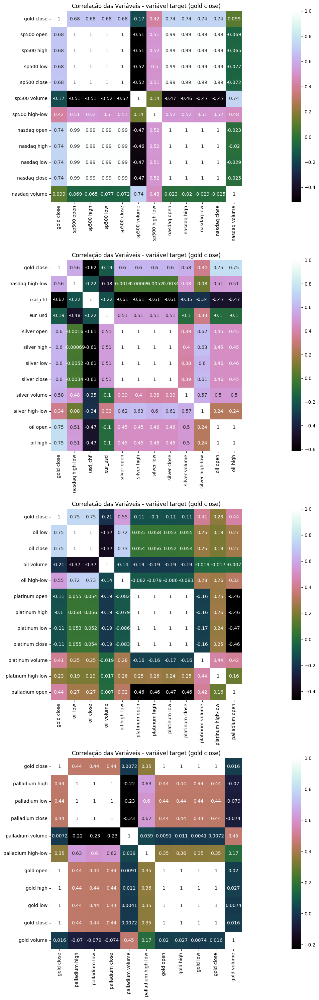

In [125]:
# analisando a correlação entre as variáveis
lista_df_gold = list(df_gold.columns[1:])
lista_target = ['gold close']

fig, axs = pyplot.subplots(nrows=4, ncols=1, figsize=(30, 30))

inicio=0
fim=11
for i in (0, 1, 2, 3):
    lista_plot = lista_target + lista_df_gold[inicio:fim]
    correlation = df_gold[lista_plot].corr()
    sns.heatmap(correlation, vmax=1, square=True, annot=True, cmap='cubehelix', ax=axs[i])

    axs[i].set_title('Correlação das Variáveis - variável target (gold close)')
    fig.tight_layout()

    inicio+= 11
    fim+= 11

pyplot.show()

In [126]:
# eliminando as variáveis que tiveram correlação menor que 0.5 com a variável alvo golde close
# correlação de 0.5 a 0.7 = moderada
# correlação de 0.7 a 0.9 = forte
# correlação acima de 0.9 = muito forte
lista_elimina = ['sp500 volume',
                'sp500 high-low',
                'nasdaq volume',
                'eur_usd',
                'silver high-low',
                'oil volume',
                'platinum open',
                'platinum high',
                'platinum low',
                'platinum close',
                'platinum volume',
                'platinum high-low',
                'palladium open',
                'palladium high',
                'palladium low',
                'palladium close',
                'palladium volume',
                'palladium high-low',
                'gold volume']

df_gold = df_gold[df_gold.columns.drop(lista_elimina)]

In [127]:
# verificando quantas colunas restaram
df_gold.shape

(3677, 25)

In [128]:
# analisando as variáveis que restaram
df_gold.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3677 entries, 0 to 3900
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   date             3677 non-null   datetime64[ns]
 1   sp500 open       3677 non-null   float64       
 2   sp500 high       3677 non-null   float64       
 3   sp500 low        3677 non-null   float64       
 4   sp500 close      3677 non-null   float64       
 5   nasdaq open      3677 non-null   float64       
 6   nasdaq high      3677 non-null   float64       
 7   nasdaq low       3677 non-null   float64       
 8   nasdaq close     3677 non-null   float64       
 9   nasdaq high-low  3677 non-null   float64       
 10  usd_chf          3677 non-null   float64       
 11  silver open      3677 non-null   float64       
 12  silver high      3677 non-null   float64       
 13  silver low       3677 non-null   float64       
 14  silver close     3677 non-null   float64     

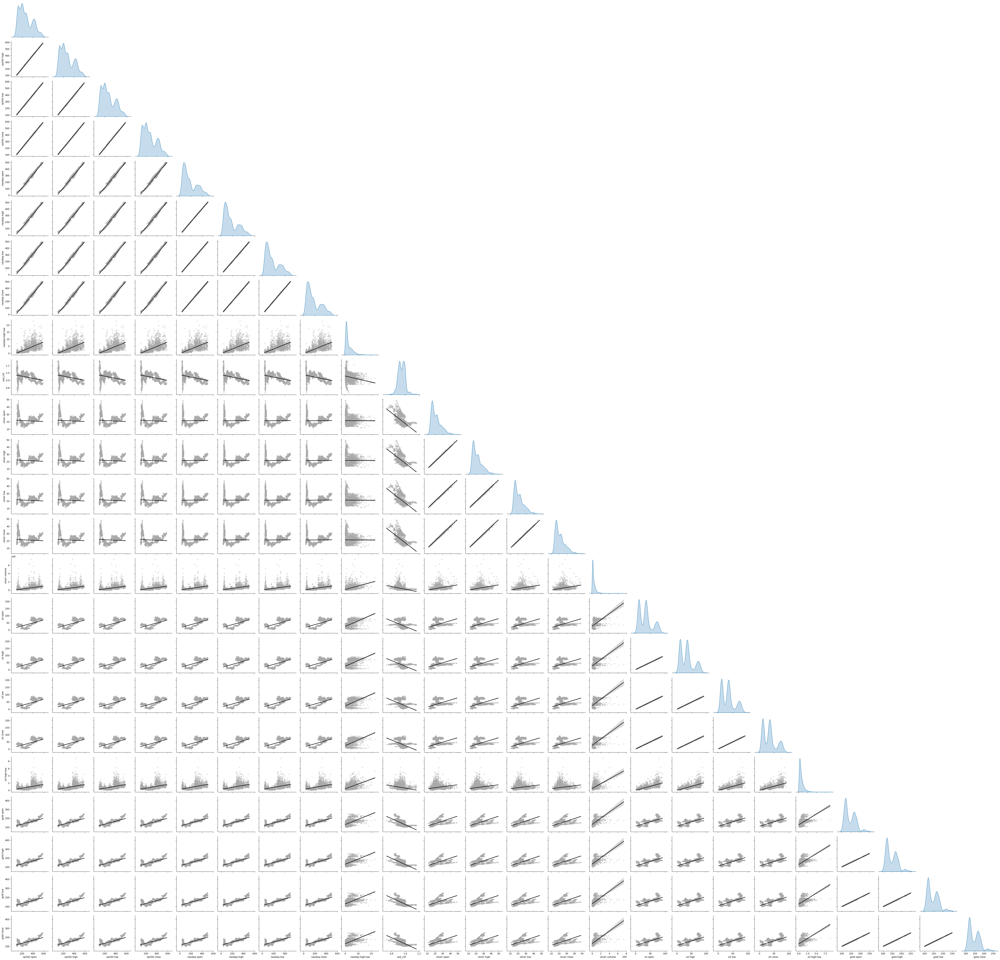

In [129]:
# verificando a dispersão das variáveis
# verificando a distribuição dos dados
p= sns.pairplot(
   df_gold[list(df_gold.columns[1:])],
                diag_kind="kde", corner=True, markers="+",
                plot_kws={'line_kws':{'lw': 2, 'color':'#000000'}, 
                           'scatter_kws': {'alpha': 0.5, 
                                           'color': '#A9A9A9'}},
                kind='reg'
                )
p.fig.subplots_adjust(top=0.95)

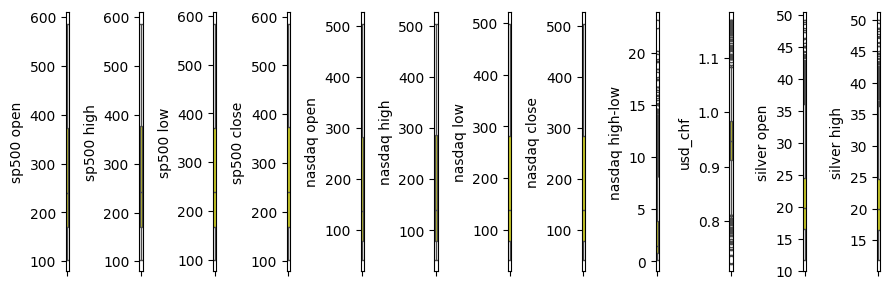

In [130]:
# visualizando boxplot para ver a distribuição nos quartis e a existência de outliers
# os outliers que sobraram não apresentam muita distorção, vamos mantê-los para não diminuir muito nossa
# base de dados
fig, axs = pyplot.subplots(nrows=1, ncols=12, figsize=(9, 3), tight_layout=True)

search_outliers = list(df_gold.columns[1:13])

for i, column in enumerate(search_outliers):
    sns.boxplot(y=column, data=df_gold, ax=axs[i], color='yellow')
pyplot.show()

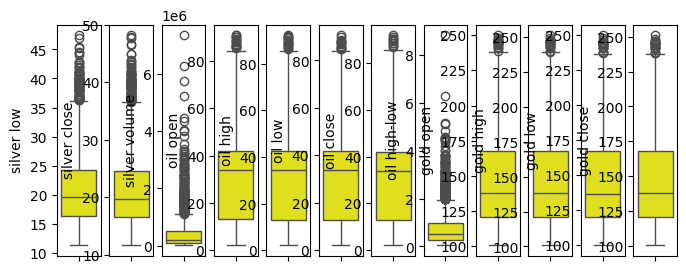

In [131]:
# visualizando boxplot para ver a distribuição nos quartis e a existência de outliers
# os outliers que sobraram não apresentam muita distorção, vamos mantê-los para não diminuir muito nossa
# base de dados
fig, axs = pyplot.subplots(nrows=1, ncols=12, figsize=(8, 3), tight_layout=True)

search_outliers = list(df_gold.columns[13:])

for i, column in enumerate(search_outliers):
    sns.boxplot(y=column, data=df_gold, ax=axs[i], color='yellow')
pyplot.show()

In [132]:
df_gold_salvo = df_gold

In [133]:
df_gold = df_gold_salvo

In [134]:
# chama função para retirar outliers, vamos passar mais de uma vez para reduzir os outliers
df_gold = rto.retira_outliers(df_gold)
df_gold = rto.retira_outliers(df_gold)
df_gold = rto.retira_outliers(df_gold)
df_gold = rto.retira_outliers(df_gold)
df_gold = rto.retira_outliers(df_gold)
df_gold = rto.retira_outliers(df_gold)
df_gold = rto.retira_outliers(df_gold)
df_gold = rto.retira_outliers(df_gold)
df_gold = rto.retira_outliers(df_gold)

df_gold.shape

(1206, 25)

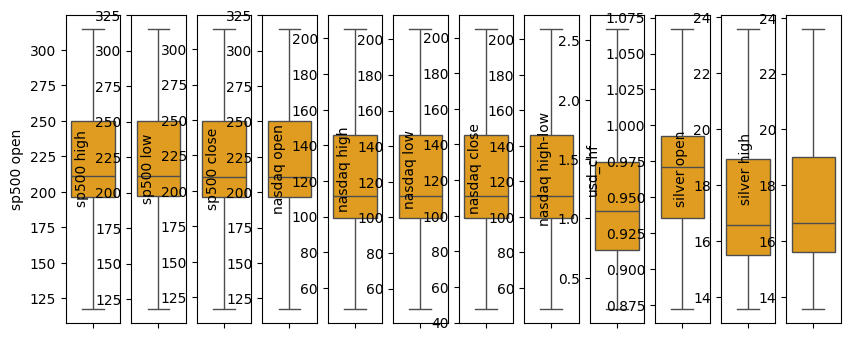

In [135]:
# visualizando boxplot para ver a distribuição nos quartis e a existência de outliers
# os outliers que sobraram não apresentam muita distorção, vamos mantê-los para não diminuir muito nossa
# base de dados
fig, axs = pyplot.subplots(nrows=1, ncols=12, figsize=(10, 4), tight_layout=True)

search_outliers = list(df_gold.columns[1:13])

for i, column in enumerate(search_outliers):
    sns.boxplot(y=column, data=df_gold, ax=axs[i], color='orange')
pyplot.show()

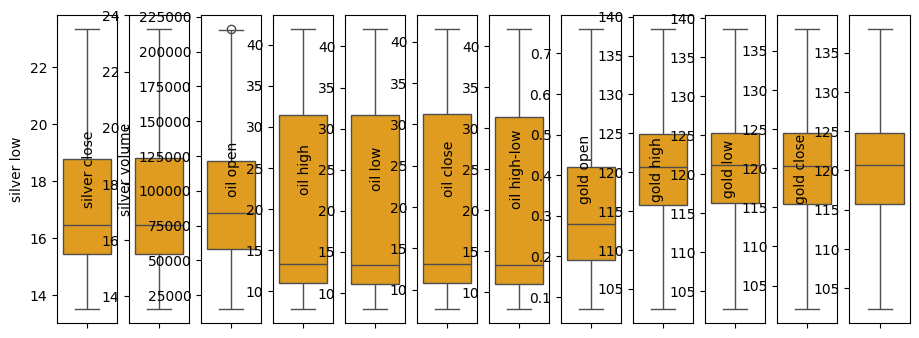

In [136]:
# visualizando boxplot para ver a distribuição nos quartis e a existência de outliers
# os outliers que sobraram não apresentam muita distorção, vamos mantê-los para não diminuir muito nossa
# base de dados
fig, axs = pyplot.subplots(nrows=1, ncols=12, figsize=(11, 4), tight_layout=True)

search_outliers = list(df_gold.columns[13:])

for i, column in enumerate(search_outliers):
    sns.boxplot(y=column, data=df_gold, ax=axs[i], color='orange')
pyplot.show()

In [137]:
df_gold = df_gold.reset_index()
df_gold = df_gold.drop('index', axis=1)

In [138]:
df_gold.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1206 entries, 0 to 1205
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   date             1206 non-null   datetime64[ns]
 1   sp500 open       1206 non-null   float64       
 2   sp500 high       1206 non-null   float64       
 3   sp500 low        1206 non-null   float64       
 4   sp500 close      1206 non-null   float64       
 5   nasdaq open      1206 non-null   float64       
 6   nasdaq high      1206 non-null   float64       
 7   nasdaq low       1206 non-null   float64       
 8   nasdaq close     1206 non-null   float64       
 9   nasdaq high-low  1206 non-null   float64       
 10  usd_chf          1206 non-null   float64       
 11  silver open      1206 non-null   float64       
 12  silver high      1206 non-null   float64       
 13  silver low       1206 non-null   float64       
 14  silver close     1206 non-null   float64

In [139]:
# definindo uma instância do columnTransformer para fazer uma verificação de transformação de variáveis
preprocessing = ColumnTransformer(
    [
        ("standard", StandardScaler(), list(df_gold.columns[1:])),
        #("minmax", MinMaxScaler(), list(df_gold.columns[1:])),
    ]
)

preprocessing.fit_transform(df_gold[list(df_gold.columns[1:])],)

array([[-2.77124338, -2.77834941, -2.76627153, ..., -1.48940575,
        -1.44805554, -1.4572615 ],
       [-2.75935949, -2.76278382, -2.7446297 , ..., -1.41394414,
        -1.39618818, -1.36441168],
       [-2.72106693, -2.73086117, -2.70134602, ..., -0.95175833,
        -0.99458663, -1.05196464],
       ...,
       [ 2.42624552,  2.4250416 ,  2.44017396, ...,  2.43865215,
         2.53980337,  2.48517167],
       [ 2.43284769,  2.41580778,  2.43199229, ...,  2.57440078,
         2.57685149,  2.61044525],
       [ 2.40538268,  2.40050602,  2.39900168, ...,  2.60317814,
         2.6746585 ,  2.62665712]])

- Aqui os dados foram transformados, primeiro as variáveis categóricas em binárias sendo criadas colunas com cada categoria existente e depois as variáveis numéricas foram transformadas em um intervalo entre 0 e 1 afim de melhorar a normalidade.

In [140]:
# fazendo a transformação de variáveis com fit_transform e convertendo para um dataframe
df_gold_trans = pd.DataFrame(
    preprocessing.fit_transform(df_gold[list(df_gold.columns[1:])],),
    columns=preprocessing.get_feature_names_out(), 
)

- Nessa fase as variáveis são transformadas através do fit_transform e convertidos em dataframe sendo armazenadas no dataframe df_acidentes_aero_trans para posterior junção com o dataframe de variáveis categóricas originais.

In [141]:
# juntando o dataframe original dos dados categóricos com o dataframe gerado com variáveis transformadas
df_gold_trans = pd.concat([df_gold, df_gold_trans], axis=1)

In [142]:
# verificando os dados das primeiras linhas dos dois dataframes juntados
df_gold_trans.head(3)

,date,sp500 open,sp500 high,sp500 low,sp500 close,nasdaq open,nasdaq high,nasdaq low,nasdaq close,nasdaq high-low,usd_chf,silver open,silver high,silver low,silver close,silver volume,oil open,oil high,oil low,oil close,oil high-low,gold open,gold high,gold low,gold close,standard__sp500 open,standard__sp500 high,standard__sp500 low,standard__sp500 close,standard__nasdaq open,standard__nasdaq high,standard__nasdaq low,standard__nasdaq close,standard__nasdaq high-low,standard__usd_chf,standard__silver open,standard__silver high,standard__silver low,standard__silver close,standard__silver volume,standard__oil open,standard__oil high,standard__oil low,standard__oil close,standard__oil high-low,standard__gold open,standard__gold high,standard__gold low,standard__gold close
0,2010-04-01,117.80,118.25,117.10,117.80,48.34,48.70,47.79,48.16,0.91,1.0559,17.89,17.95,17.79,17.84,96350.0,41.01,41.290,40.96,41.24,0.330,109.97,110.4700,109.92,110.26,-2.771243,-2.778349,-2.766272,-2.770555,-2.207742,-2.205655,-2.211944,-2.211372,-0.456933,2.393095,0.373972,0.355181,0.377596,0.355303,0.079335,2.077471,2.082618,2.094654,2.099029,0.090875,-1.500334,-1.489406,-1.448056,-1.457262
1,2010-04-05,118.25,118.84,117.92,118.76,48.26,48.72,48.14,48.61,0.58,1.0619,17.95,18.10,17.90,18.08,180524.0,41.52,42.110,41.44,42.07,0.670,110.56,110.9837,110.27,110.89,-2.759359,-2.762784,-2.744630,-2.745236,-2.210116,-2.205064,-2.201534,-2.198044,-1.072927,2.547151,0.401619,0.423798,0.428713,0.466116,2.020602,2.125380,2.159397,2.139887,2.176981,2.264872,-1.413354,-1.413944,-1.396188,-1.364412
2,2010-04-12,119.70,120.05,119.56,119.74,49.05,49.20,48.94,49.07,0.26,1.0598,18.38,18.46,18.11,18.12,102729.0,41.11,41.485,40.90,40.93,0.585,113.64,114.1300,112.98,113.01,-2.721067,-2.730861,-2.701346,-2.719390,-2.186671,-2.190875,-2.177741,-2.184421,-1.670255,2.493231,0.599753,0.588479,0.526299,0.484584,0.226451,2.086865,2.100876,2.089000,2.069914,1.721372,-0.959291,-0.951758,-0.994587,-1.051965


In [143]:
df_gold_trans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1206 entries, 0 to 1205
Data columns (total 49 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       1206 non-null   datetime64[ns]
 1   sp500 open                 1206 non-null   float64       
 2   sp500 high                 1206 non-null   float64       
 3   sp500 low                  1206 non-null   float64       
 4   sp500 close                1206 non-null   float64       
 5   nasdaq open                1206 non-null   float64       
 6   nasdaq high                1206 non-null   float64       
 7   nasdaq low                 1206 non-null   float64       
 8   nasdaq close               1206 non-null   float64       
 9   nasdaq high-low            1206 non-null   float64       
 10  usd_chf                    1206 non-null   float64       
 11  silver open                1206 non-null   float64       
 12  silver

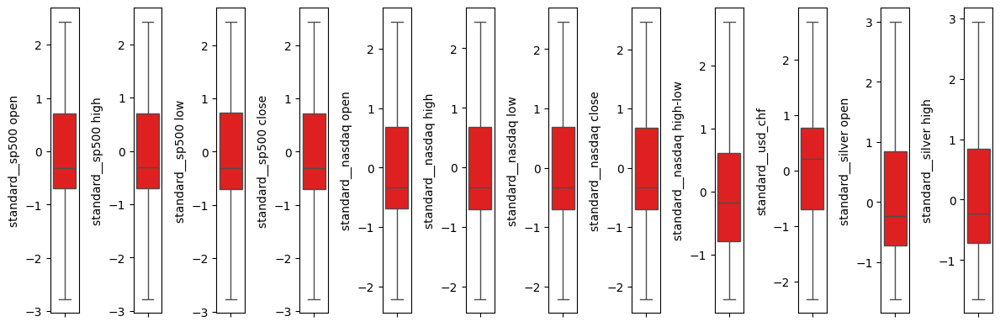

In [144]:
# visualizando boxplot para ver a distribuição nos quartis e a existência de outliers
# os outliers que sobraram não apresentam muita distorção, vamos mantê-los para não diminuir muito nossa
# base de dados
fig, axs = pyplot.subplots(nrows=1, ncols=12, figsize=(12, 4), tight_layout=True)

search_outliers = list(df_gold_trans.columns[25:37])

for i, column in enumerate(search_outliers):
    sns.boxplot(y=column, data=df_gold_trans, ax=axs[i], color='red')
pyplot.show()

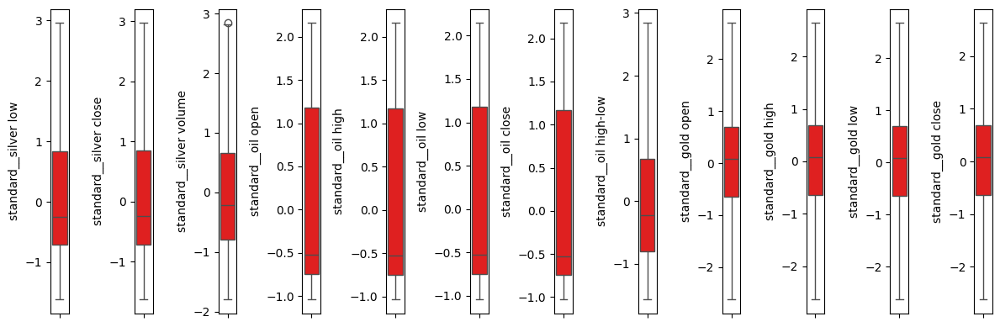

In [145]:
# visualizando boxplot para ver a distribuição nos quartis e a existência de outliers
# os outliers que sobraram não apresentam muita distorção, vamos mantê-los para não diminuir muito nossa
# base de dados
fig, axs = pyplot.subplots(nrows=1, ncols=12, figsize=(12, 4), tight_layout=True)

search_outliers = list(df_gold_trans.columns[37:])

for i, column in enumerate(search_outliers):
    sns.boxplot(y=column, data=df_gold_trans, ax=axs[i], color='red')
pyplot.show()

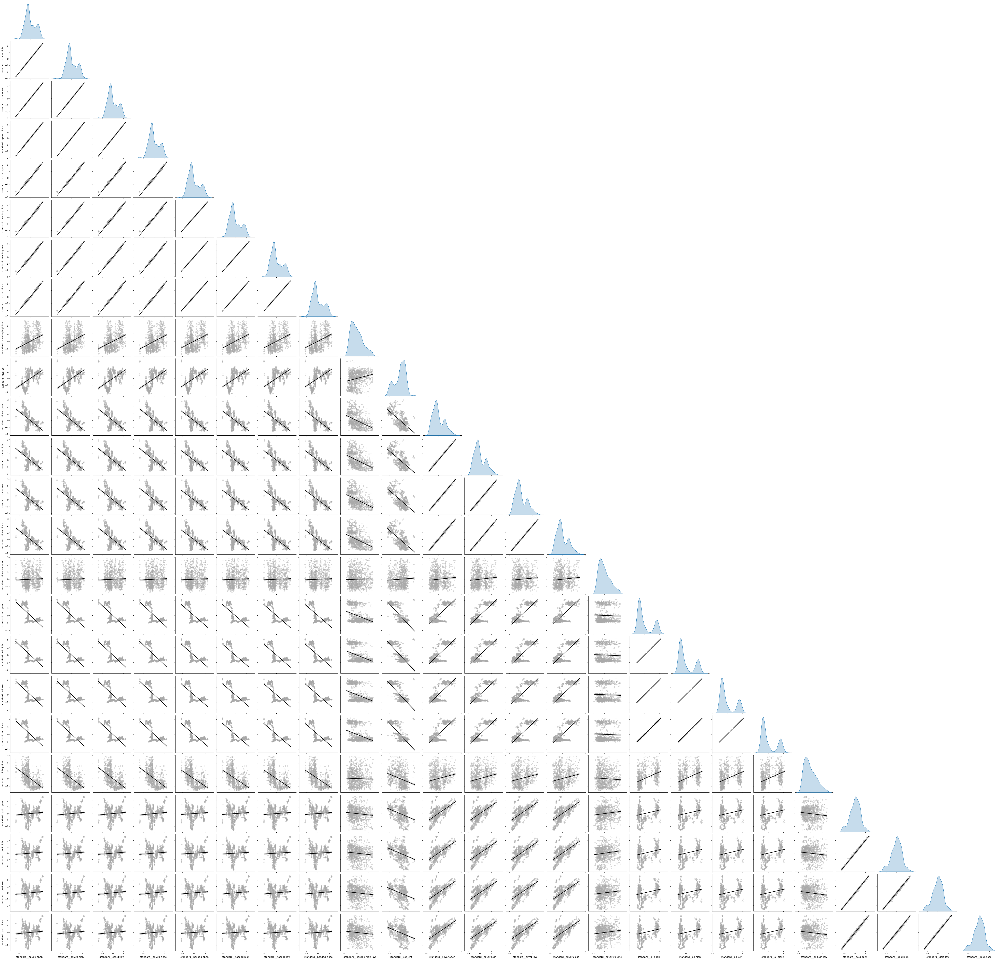

In [146]:
# verificando a dispersão das variáveis
# verificando a distribuição dos dados
p= sns.pairplot(
                df_gold_trans[list(df_gold_trans.columns[25:])],
                diag_kind="kde", corner=True, markers="+",
                plot_kws={'line_kws':{'lw': 2, 'color':'#000000'}, 
                           'scatter_kws': {'alpha': 0.5, 
                                           'color': '#A9A9A9'}},
                kind='reg'
                )
p.fig.subplots_adjust(top=0.95)

In [147]:
list(df_gold_trans)

['date',
 'sp500 open',
 'sp500 high',
 'sp500 low',
 'sp500 close',
 'nasdaq open',
 'nasdaq high',
 'nasdaq low',
 'nasdaq close',
 'nasdaq high-low',
 'usd_chf',
 'silver open',
 'silver high',
 'silver low',
 'silver close',
 'silver volume',
 'oil open',
 'oil high',
 'oil low',
 'oil close',
 'oil high-low',
 'gold open',
 'gold high',
 'gold low',
 'gold close',
 'standard__sp500 open',
 'standard__sp500 high',
 'standard__sp500 low',
 'standard__sp500 close',
 'standard__nasdaq open',
 'standard__nasdaq high',
 'standard__nasdaq low',
 'standard__nasdaq close',
 'standard__nasdaq high-low',
 'standard__usd_chf',
 'standard__silver open',
 'standard__silver high',
 'standard__silver low',
 'standard__silver close',
 'standard__silver volume',
 'standard__oil open',
 'standard__oil high',
 'standard__oil low',
 'standard__oil close',
 'standard__oil high-low',
 'standard__gold open',
 'standard__gold high',
 'standard__gold low',
 'standard__gold close']

In [148]:
# excluindo variáveis com alto deslocamento da média e variância
df_gold_trans = df_gold_trans[df_gold_trans.columns.drop([  'standard__oil open',
                                                            'standard__oil high',
                                                            'standard__oil low',
                                                            'standard__oil close',

                                                            'oil open',
                                                            'oil high',
                                                            'oil low',
                                                            'oil close',
                                                        ])]

In [149]:
# verificando a posição das variáveis
df_gold_trans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1206 entries, 0 to 1205
Data columns (total 41 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       1206 non-null   datetime64[ns]
 1   sp500 open                 1206 non-null   float64       
 2   sp500 high                 1206 non-null   float64       
 3   sp500 low                  1206 non-null   float64       
 4   sp500 close                1206 non-null   float64       
 5   nasdaq open                1206 non-null   float64       
 6   nasdaq high                1206 non-null   float64       
 7   nasdaq low                 1206 non-null   float64       
 8   nasdaq close               1206 non-null   float64       
 9   nasdaq high-low            1206 non-null   float64       
 10  usd_chf                    1206 non-null   float64       
 11  silver open                1206 non-null   float64       
 12  silver

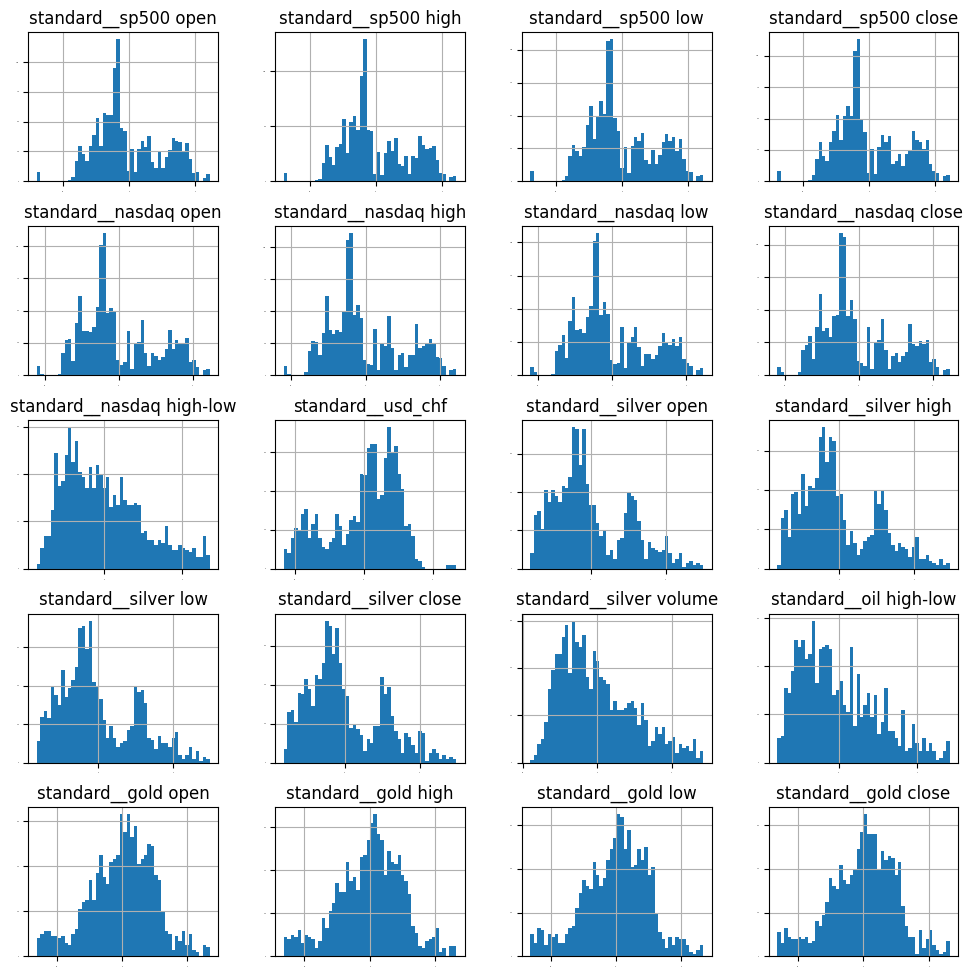

In [150]:
df_gold_trans[list(df_gold_trans.columns[21:])].hist(bins=50, sharex=False, sharey=False, 
        xlabelsize=1, ylabelsize=1, figsize=(12,12))
pyplot.show()

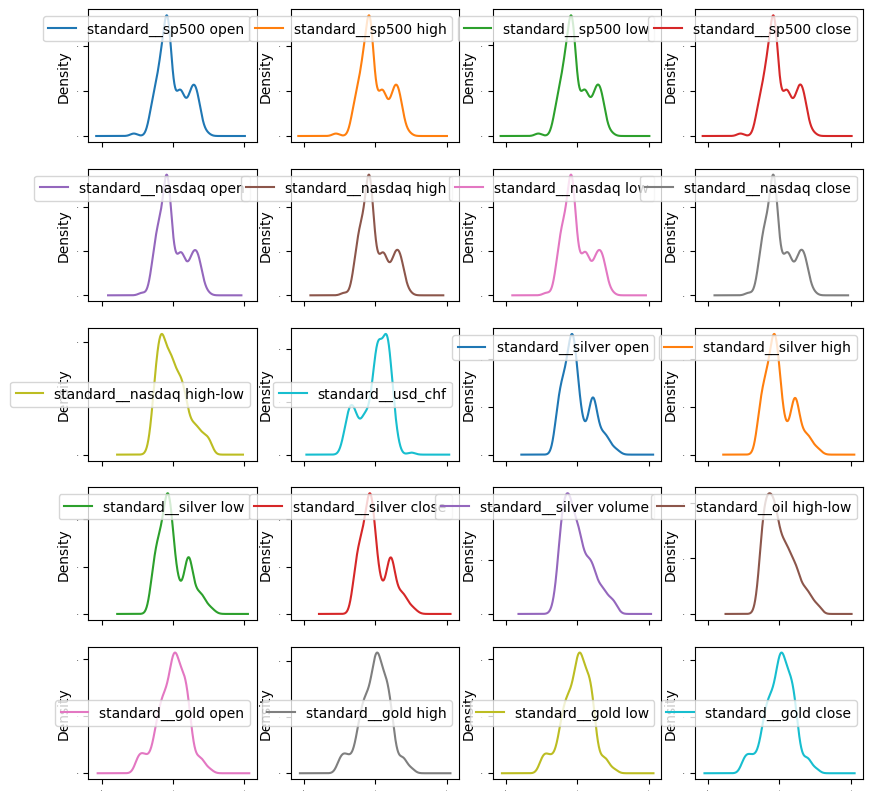

In [151]:
df_gold_trans[list(df_gold_trans.columns[21:])].plot(kind='density', subplots=True, layout=(5, 4), sharex=True, 
        legend=True, fontsize=1, figsize=(10, 10))
pyplot.show()

In [152]:
df_gold_trans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1206 entries, 0 to 1205
Data columns (total 41 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       1206 non-null   datetime64[ns]
 1   sp500 open                 1206 non-null   float64       
 2   sp500 high                 1206 non-null   float64       
 3   sp500 low                  1206 non-null   float64       
 4   sp500 close                1206 non-null   float64       
 5   nasdaq open                1206 non-null   float64       
 6   nasdaq high                1206 non-null   float64       
 7   nasdaq low                 1206 non-null   float64       
 8   nasdaq close               1206 non-null   float64       
 9   nasdaq high-low            1206 non-null   float64       
 10  usd_chf                    1206 non-null   float64       
 11  silver open                1206 non-null   float64       
 12  silver

In [153]:
# ordemando o df_gold_trans por data
df_gold_trans = df_gold_trans.sort_values('date')

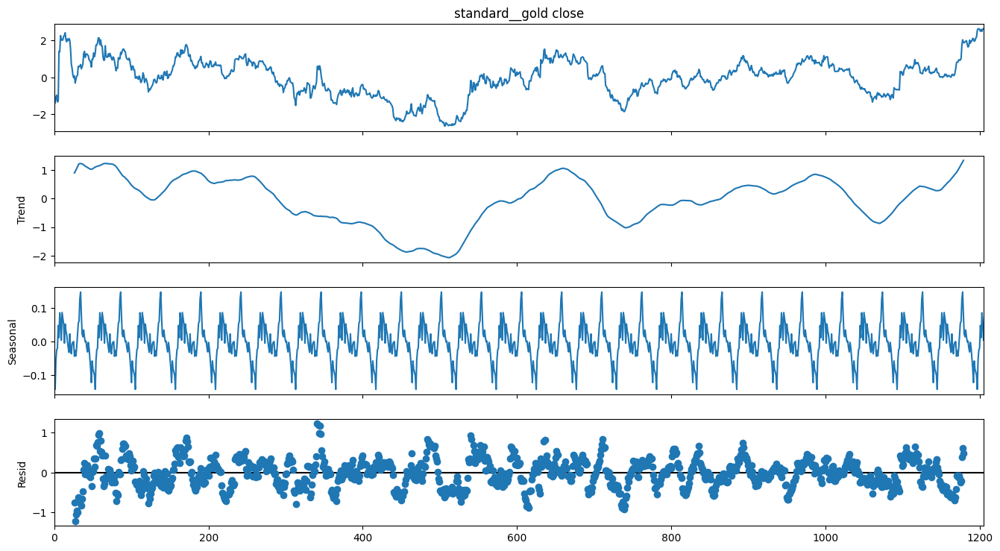

In [154]:
# analisando a série temporal - variável prevista - tendência - sazonalidade - resíduo
res = sm.tsa.seasonal_decompose(df_gold_trans['standard__gold close'], period=52)
fig = res.plot()
fig.set_figheight(8)
fig.set_figwidth(15)
pyplot.show()

In [155]:
# verificando os valores da skew e kurtosis
# os valores aceitos tanto para skew quanto para kurtosis devem variar entre -2 e 2
# gerando um dataframe com os valores de skew e kurtosis para analisarmos melhor
df_skew_kurtosis_og = pd.DataFrame()
df_skew_kurtosis_og['variavel'] = 'Nan'
df_skew_kurtosis_og['skew'] = 'Nan'
df_skew_kurtosis_og['kurtosis'] = 'Nan'

for variavel in list(list(df_gold_trans.columns[21:])):
    skewx = skew(df_gold_trans[variavel], axis=0, bias=True)
    kurtx = kurtosis(df_gold_trans[variavel], axis=0, bias=True)

    dfx = {'variavel': [variavel], 'skew': [skewx], 'kurtosis': [kurtx]}
    dfx = pd.DataFrame(dfx)
    df_skew_kurtosis_og = pd.concat([df_skew_kurtosis_og, dfx], axis=0)    

    print('skew ' + variavel, skewx)
    print('kurtosis ' + variavel, kurtx)
    print('')   

skew standard__sp500 open 0.3664230464950805
kurtosis standard__sp500 open -0.6114231951866271

skew standard__sp500 high 0.3679272780633779
kurtosis standard__sp500 high -0.6047020638158522

skew standard__sp500 low 0.3665792046853444
kurtosis standard__sp500 low -0.621943863818128

skew standard__sp500 close 0.36800750529517123
kurtosis standard__sp500 close -0.6145975144373308

skew standard__nasdaq open 0.5374569146610908
kurtosis standard__nasdaq open -0.6973034822213022

skew standard__nasdaq high 0.538531845502035
kurtosis standard__nasdaq high -0.6963108075224

skew standard__nasdaq low 0.537742905590047
kurtosis standard__nasdaq low -0.6995820049292516

skew standard__nasdaq close 0.5382885639946982
kurtosis standard__nasdaq close -0.6991097508986779

skew standard__nasdaq high-low 0.7027756199819148
kurtosis standard__nasdaq high-low -0.20222658481444533

skew standard__usd_chf -0.5690459086917092
kurtosis standard__usd_chf -0.5565714205473342

skew standard__silver open 0.68

In [156]:
# preenchendo os valore nulos com zero
# resetando o indice
df_skew_kurtosis_og = df_skew_kurtosis_og.fillna(0)
df_skew_kurtosis_og = df_skew_kurtosis_og.reset_index()
df_skew_kurtosis_og = df_skew_kurtosis_og.drop('index', axis=1)
print(df_skew_kurtosis_og)

                     variavel      skew  kurtosis
0        standard__sp500 open  0.366423 -0.611423
1        standard__sp500 high  0.367927 -0.604702
2         standard__sp500 low  0.366579 -0.621944
3       standard__sp500 close  0.368008 -0.614598
4       standard__nasdaq open  0.537457 -0.697303
5       standard__nasdaq high  0.538532 -0.696311
6        standard__nasdaq low  0.537743 -0.699582
7      standard__nasdaq close  0.538289 -0.699110
8   standard__nasdaq high-low  0.702776 -0.202227
9           standard__usd_chf -0.569046 -0.556571
10      standard__silver open  0.686063 -0.308900
11      standard__silver high  0.690408 -0.300074
12       standard__silver low  0.688059 -0.314344
13     standard__silver close  0.684773 -0.310859
14    standard__silver volume  0.736514 -0.180720
15     standard__oil high-low  0.725444 -0.204778
16        standard__gold open -0.277772  0.081417
17        standard__gold high -0.263883  0.090185
18         standard__gold low -0.286925  0.078848


In [157]:
# incluindo colunas de valores minimos e máximos para skew e kurtosis que aparecerão no gráfico
df_skew_kurtosis_og['max'] = 2
df_skew_kurtosis_og['min'] = -2

<Axes: title={'center': 'Valores de skews e kurtosis das variáveis transformadas'}, xlabel='variavel'>

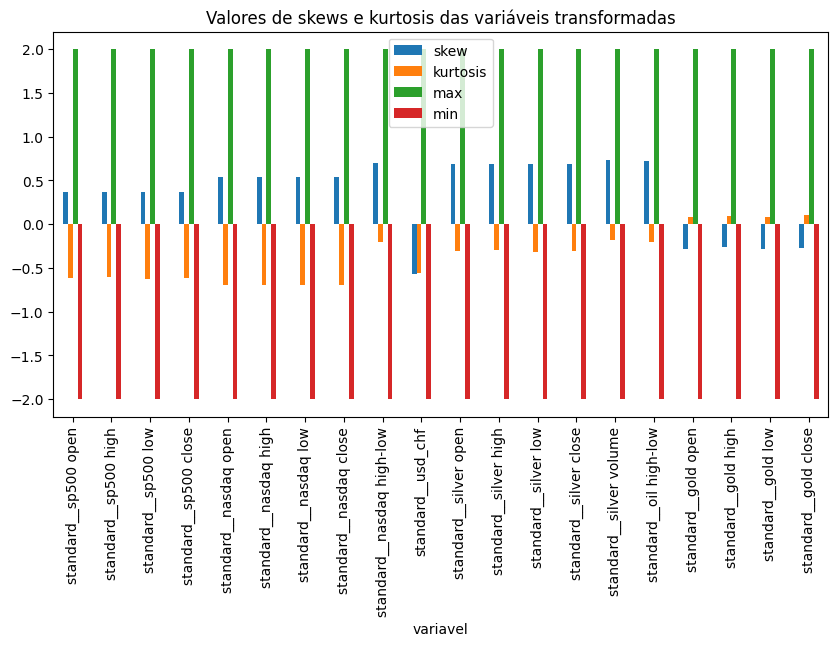

In [158]:
# plotando um gráfico para analisarmos os valores de skew e kurtosis
df_skew_kurtosis_og.plot(x='variavel', 
        kind='bar', 
        stacked=False, 
        title='Valores de skews e kurtosis das variáveis transformadas',
        figsize=(10,5))

Observamos que a maioria das variáveis ficaram com os valores dentro do máximo e mínimo de skew e kurtosis, sendo que somente CO-mg/m3/hr e NMHC-micgr/m3/hr serão excluídas, a primeira ficou fora do min e max e a segunda apresentou nulos quando do cálculo de skew e kurtosis tendo seus valores substituidos por zero para geração do gráfico. As variáveis dia_semana e hour não serão consideradas em relação a skew e kurtosis pois são variáveis categóricas e serão transformadas em binárias para cada um de seus valores.

In [159]:
# salva os dados tratados em arquivo csv organizado pelo índice
df_gold_trans.sort_index().to_csv('df_treated/df_gold_trans.csv', index=False)